# Лабораторная работа №2. Фильтрация изображений

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Часть 1:

**Задание 1:** Учитывая следующее изображение I

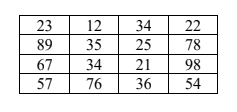

И следующее ядро K:

[![image.png](https://i.postimg.cc/kgmSzDyD/image.png)](https://postimg.cc/crF68x2N)

- Отфильтруйте изображение I, используя ядро K и технику заполнения 0.
- Отфильтруйте изображение I, используя медианный фильтр размером 3x3 и технику заполнения нулями.
- Визуализируйте полученный результат.

In [16]:
I = np.array([
    [23, 12, 34, 22],
    [89, 35, 25, 78],
    [67, 34, 21, 98],
    [57, 76, 36, 54]
])

height, width = I.shape

result1 = np.zeros_like(I, dtype=np.float64)
result2 = np.zeros_like(I, dtype=np.float64)


padded_image = np.pad(I, ((1, 1), (1, 1)), mode='constant', constant_values=0)

K = 1/37* np.array([
    [23, 12, 34],
    [89, 35, 25],
    [67, 34, 21]
            ])


for i in range(1, height + 1):
    for j in range(1, width + 1):
        neighborhood = padded_image[i-1:i+2, j-1:j+2]

        result1[i-1, j-1] = np.sum(neighborhood * K)
        result2[i-1, j-1] = np.median(neighborhood)

print('После ядра K')
display(result1)
print('После медианного фильтра')
result2

После ядра K


array([[131.51351351, 297.16216216, 206.51351351, 219.54054054],
       [207.18918919, 478.        , 335.72972973, 290.27027027],
       [242.89189189, 490.64864865, 470.75675676, 298.86486486],
       [158.24324324, 305.2972973 , 371.35135135, 182.51351351]])

После медианного фильтра


array([[ 0., 23., 22.,  0.],
       [23., 34., 34., 22.],
       [35., 36., 36., 25.],
       [ 0., 34., 34.,  0.]])

**Задание 2:** Учитывая следующее изображение J:

![image.png](https://i.imgur.com/bL8xXHS.png)

- Сгладьте изображение J с использованием усредняющего фильтра размером 3x3 и метода заполнения нулями.
- Увеличьте резкость изображения J, используя фильтр Лапласа размером 3x3 и технику заполнения нулями.
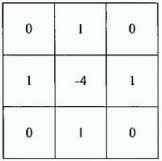
- Увеличьте резкость изображения J, используя фильтр Собеля размером 3x3 и технику заполнения нулями.
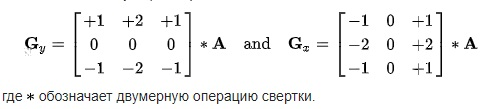

In [17]:
J = np.array([
    [123, 127, 128, 119, 115, 130],
    [140, 145, 148, 153, 167, 172],
    [133, 154, 183, 192, 194, 191],
    [194, 199, 207, 210, 198, 195],
    [164, 170, 175, 162, 173, 151]
])


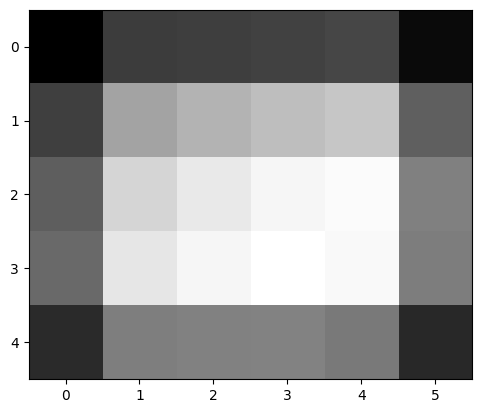

In [18]:
height, width = J.shape

result = np.zeros_like(J, dtype=np.float64)


padded_image = np.pad(J, ((1, 1), (1, 1)), mode='constant', constant_values=0)


for i in range(1, height + 1):
    for j in range(1, width + 1):
        neighborhood = padded_image[i-1:i+2, j-1:j+2]

        result[i-1, j-1] = np.mean(neighborhood)
        
result
plt.imshow(result,cmap='grey')


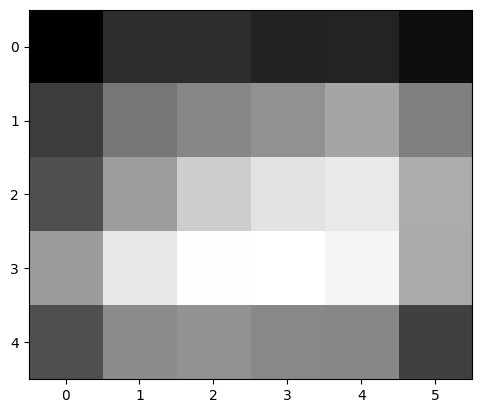

In [19]:
laplace_filter = np.array([
    [0, 1, 0],
    [1, 4, 1],
    [0, 1, 0]
])

result = np.zeros_like(J, dtype=np.float64)


padded_image = np.pad(J, ((1, 1), (1, 1)), mode='constant', constant_values=0)


for i in range(1, height + 1):
    for j in range(1, width + 1):
        neighborhood = padded_image[i-1:i+2, j-1:j+2]

        result[i-1, j-1] = np.sum(neighborhood*laplace_filter)
        
result
plt.imshow(result,cmap='grey')

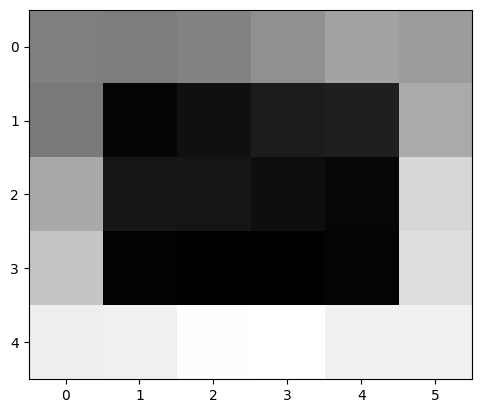

In [20]:
gradient_x = np.zeros_like(J, dtype=np.float64)
gradient_y = np.zeros_like(J, dtype=np.float64)

padded_image = np.pad(J, ((1, 1), (1, 1)), mode='constant', constant_values=0)

sobel_x = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]])

sobel_y = np.array([[-1, -2, -1],
                    [ 0, 0, 0],
                    [ 1, 2, 1]])

for i in range(1, height + 1):
    for j in range(1, width + 1):
        neighborhood = padded_image[i-1:i+2, j-1:j+2]

        gradient_x[i-1, j-1] = np.sum(neighborhood * sobel_x)
        gradient_y[i-1, j-1] = np.sum(neighborhood * sobel_y)
        
result = gradient_x**2 + gradient_y**2
plt.imshow(result,cmap='grey')

# Часть 2. Используйте OpenCV и Python для выполнения следующих задач:

- Загрузите из Интернета несколько изображений (N > 2) в оттенках серого для своей работы.

In [21]:
import cv2

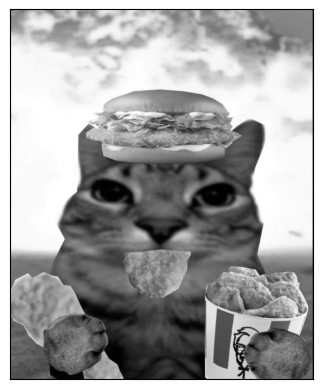

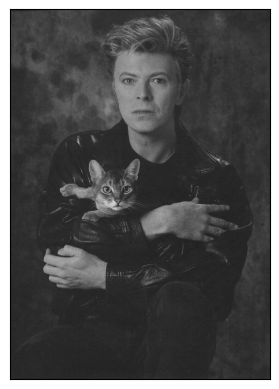

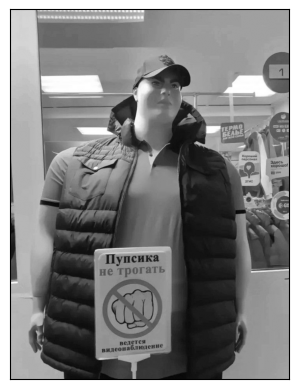

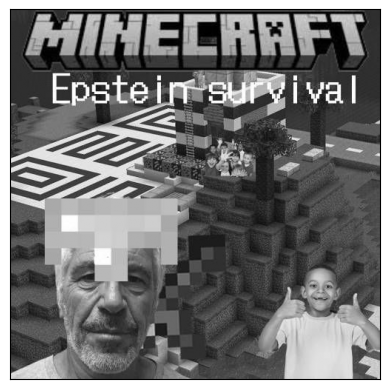

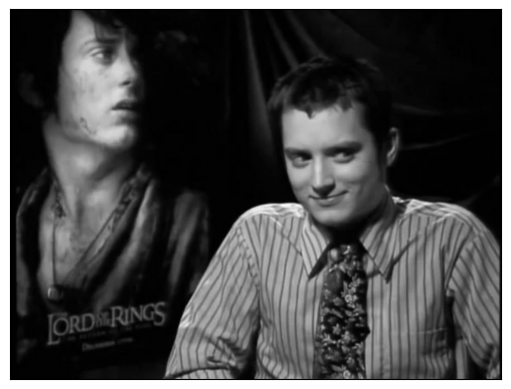

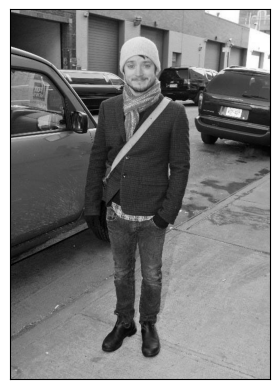

In [22]:
filenames = [
    "cat.jpg",
    "pic.jpg",
    "pupsik.jpg",
    "some_pic.jpg",
    "weegsjpg.jpg",
    "blackholw.jpg"
]

images = []

for file in filenames:
    images.append(cv2.imread(file, cv2.IMREAD_GRAYSCALE))
    plt.imshow(images[-1], cmap='grey')
    plt.xticks([])
    plt.yticks([])
    plt.show()


**Задание 1.** Загрузите изображение и отобразите его и его гистограмму на экране.

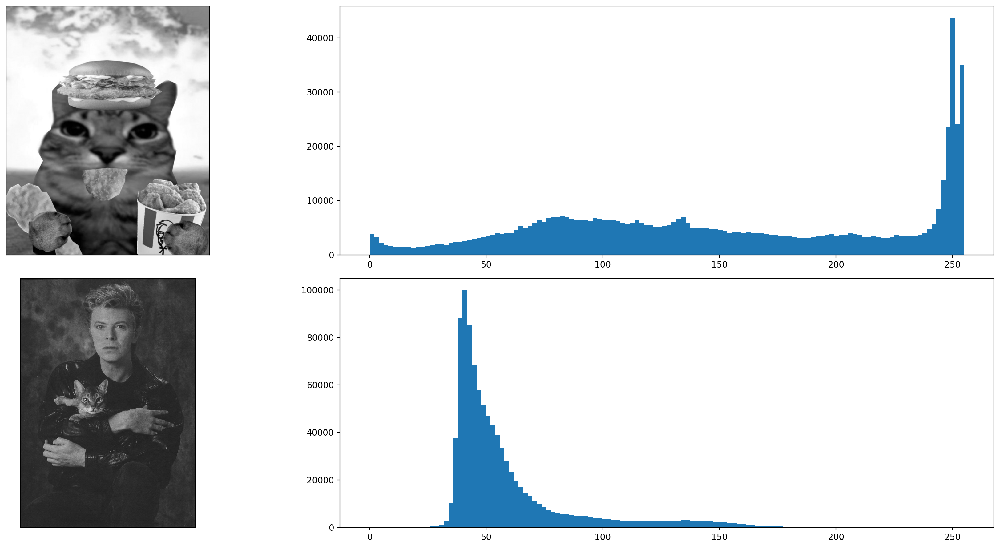

In [23]:
fig,ax = plt.subplots(len(images[:2]),2, dpi = 200, figsize=(20, 9))
ax=ax.flatten()
for idx, im_array in enumerate(images[:2]):
    ax[idx*2].imshow(im_array, cmap='grey')
    ax[idx*2].set_xticks([])
    ax[idx*2].set_yticks([])


    ax[idx*2+1].hist(im_array.flatten(), 128) 

plt.tight_layout()
plt.show()

**Задание 2:** Примените фильтр усреднения с помощью функции: _cv2.blur()_, фильтр Гаусса с помощью функции _cv2.GaussianBlur()_ и медианный фильтр с помощью функции _cv2.medianBlur()_ к загруженному изображению, чтобы размыть его. Отобразите отфильтрованные изображения и сравните разницу с исходным изображением.

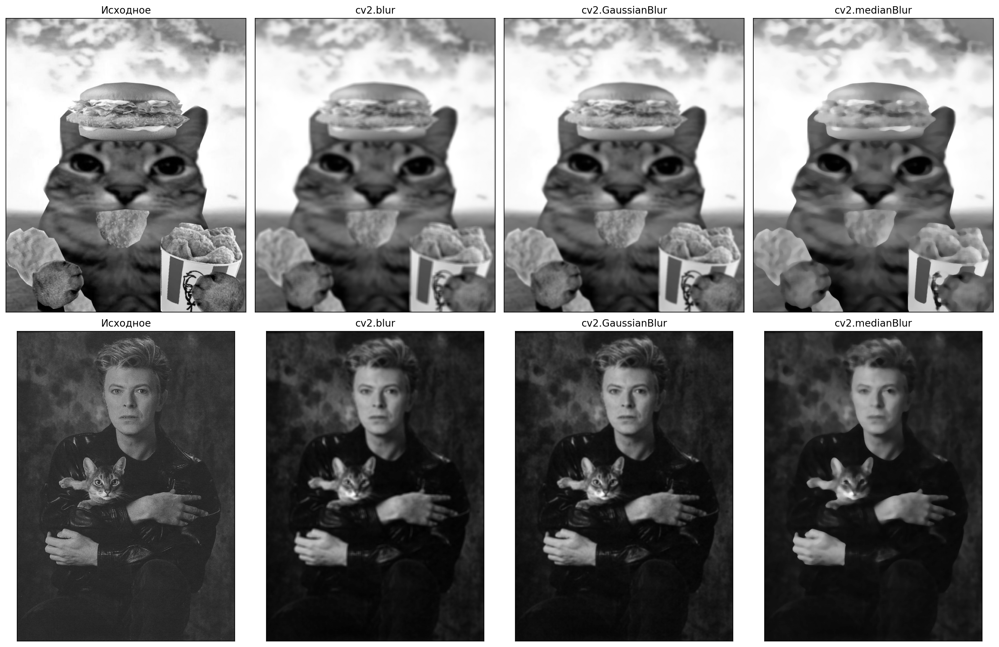

In [24]:
fig,ax = plt.subplots(len(images[:2]),4 , dpi = 200, figsize=(17,11))
ax=ax.flatten()
for idx, im_array in enumerate(images[:2]):
    ax[idx*4].set_title('Исходное')
    ax[idx*4].imshow(im_array, cmap='grey')
    ax[idx*4].set_xticks([])
    ax[idx*4].set_yticks([])

    new_im_array = cv2.blur(im_array,ksize=(10, 10))
    ax[idx*4+1].set_title('cv2.blur')
    ax[idx*4+1].imshow(new_im_array, cmap='grey') 
    ax[idx*4+1].set_xticks([])
    ax[idx*4+1].set_yticks([])
    
    new_im_array = cv2.GaussianBlur(im_array,(13, 13),0)
    ax[idx*4+2].set_title('cv2.GaussianBlur')
    ax[idx*4+2].imshow(new_im_array, cmap='grey') 
    ax[idx*4+2].set_xticks([])
    ax[idx*4+2].set_yticks([])

    new_im_array = cv2.medianBlur(im_array,13)
    ax[idx*4+3].set_title('cv2.medianBlur')
    ax[idx*4+3].imshow(new_im_array, cmap='grey') 
    ax[idx*4+3].set_xticks([])
    ax[idx*4+3].set_yticks([])
    
plt.tight_layout()
plt.show()

**Задание 3.** Добавьте к загруженному изображению гауссов шум (N ~ (m=0, sigma=3)), шум соли (I = 255) и перца (I = 0) и периодический шум, а затем отобразите зашумленные изображения с соответствующей им гистограммой.

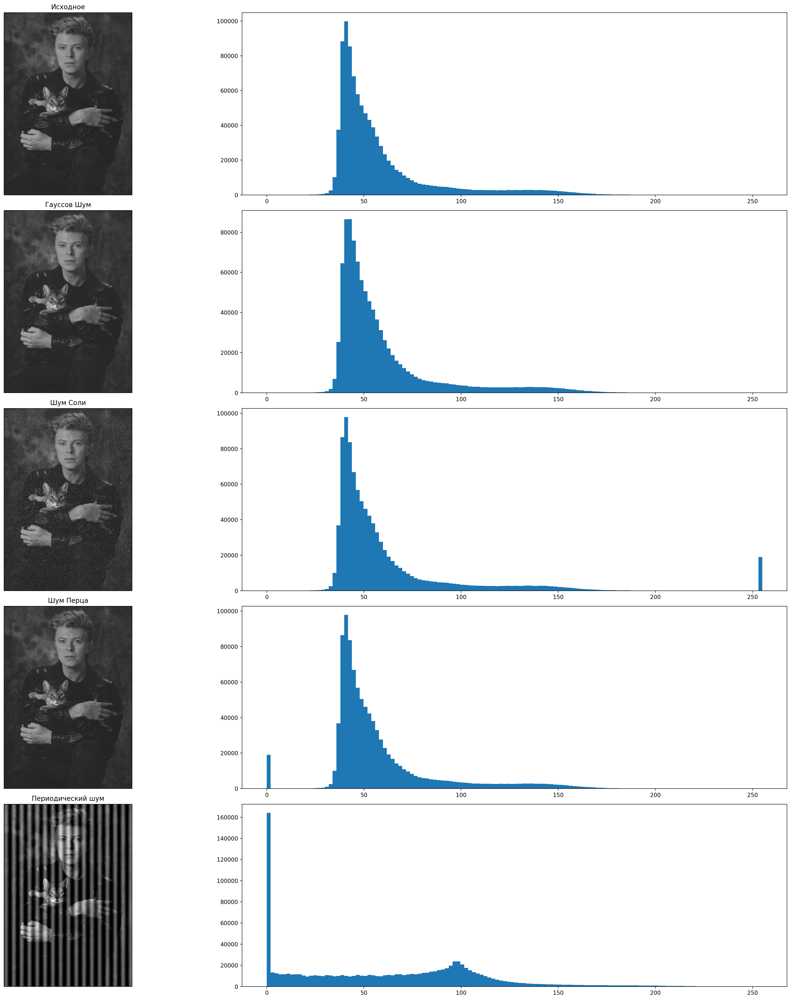

In [28]:
fig,ax = plt.subplots(5,2 , dpi = 200, figsize = (25, 25))
ax=ax.flatten()
shum_arrays = []
im_array = images[1]
salt_prob = 0.02

ax[0].set_title('Исходное')
ax[0].imshow(im_array, cmap='grey')
ax[0].set_xticks([])
ax[0].set_yticks([])

ax[1].hist(im_array.flatten(), 128)


new_im_array = im_array + cv2.randn(np.zeros_like(im_array), 0, 3)
ax[2].set_title('Гауссов Шум')
ax[2].imshow(new_im_array, cmap='grey') 
ax[2].set_xticks([])
ax[2].set_yticks([])
ax[3].hist(new_im_array.flatten(), 128)
shum_arrays.append((new_im_array, 'Гауссов Шум'))



new_im_array = im_array.copy()
h, w = im_array.shape[:2]

num_salt = int(h * w * salt_prob)
coords = [np.random.randint(0, i, num_salt) for i in (h, w)]
if len(im_array.shape) == 3:
        new_im_array[coords[0], coords[1], :] = 255
else:
    new_im_array[coords[0], coords[1]] = 255
ax[4].set_title('Шум Соли')
ax[4].imshow(new_im_array, cmap='grey') 
ax[4].set_xticks([])
ax[4].set_yticks([])
ax[5].hist(new_im_array.flatten(), 128)
shum_arrays.append((new_im_array, 'Шум Соли'))


new_im_array = im_array.copy()

num_salt = int(h * w * salt_prob)
coords = [np.random.randint(0, i, num_salt) for i in (h, w)]
if len(im_array.shape) == 3:
        new_im_array[coords[0], coords[1], :] = 0
else:
    new_im_array[coords[0], coords[1]] = 0

ax[6].set_title('Шум Перца')
ax[6].imshow(new_im_array, cmap='grey') 
ax[6].set_xticks([])
ax[6].set_yticks([])
ax[7].hist(new_im_array.flatten(), 128)
shum_arrays.append((new_im_array, "Шум Перца"))


amplitude = 60
frequency = 50
y, x = np.ogrid[:h, :w]
noise = amplitude * np.sin(2 * np.pi * x / frequency)

if len(im_array.shape) == 3:
    noise = np.repeat(noise[:, :, np.newaxis], 3, axis=2)
    
new_im_array = np.clip(im_array.astype(np.float32) + noise, 0, 255).astype(np.uint8)

ax[8].set_title('Периодический шум')
ax[8].imshow(new_im_array, cmap='grey') 
ax[8].set_xticks([])
ax[8].set_yticks([])
ax[9].hist(new_im_array.flatten(), 128)
shum_arrays.append((new_im_array, "Периодический шум"))

plt.tight_layout()
plt.show()

**Задание 4.** Примените усредняющий фильтр, фильтр Гаусса и медианный фильтр к трем зашумленным изображениям, чтобы удалить шум. Отобразите изображения с шумом и изображения с удалением шума, чтобы увидеть разницу. Посчитайте MSE в зашумленном и отфильтрованном изображениях относительно оригинала.

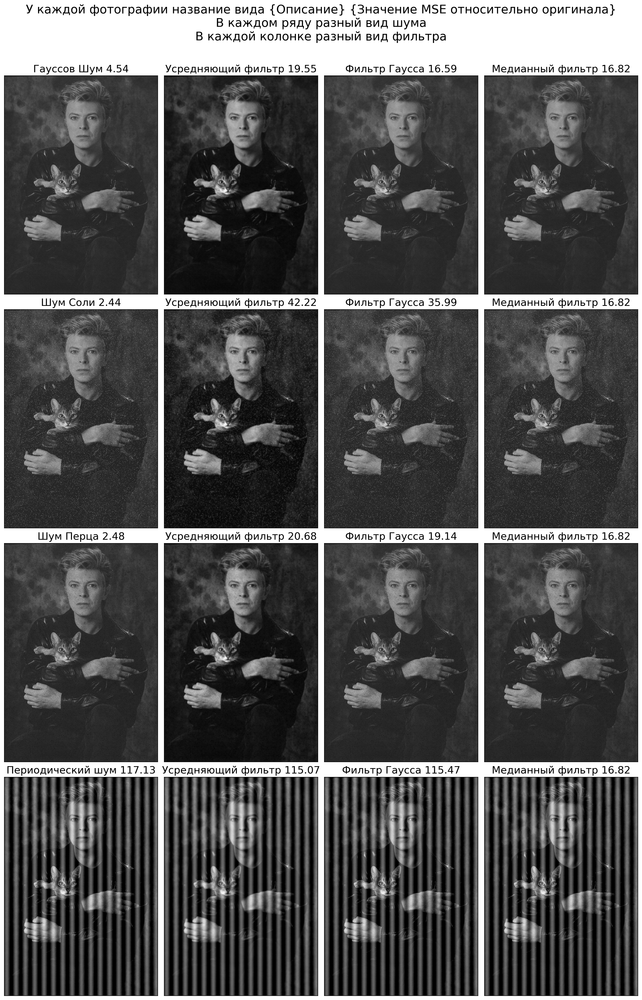

In [64]:
fig,ax = plt.subplots(4,4 , dpi = 200, figsize = (15, 23))
fig.suptitle('У каждой фотографии название вида {Описание} {Значение MSE относительно оригинала}\nВ каждом ряду разный вид шума\nВ каждой колонке разный вид фильтра', size = 20, y = 1.01)
ax=ax.flatten()
for idx, (shum_arr, title) in enumerate(shum_arrays):    
    ax[idx*4].imshow(shum_arr, cmap='grey')
    ax[idx*4].set_title(title + f' {np.power((shum_arr-im_array),2).mean():.2f}', size = 17)
    ax[idx*4].set_xticks([])
    ax[idx*4].set_yticks([])
    
    after_mean = cv2.blur(shum_arr,ksize=(5, 5))
    ax[idx*4+1].imshow(after_mean, cmap='grey')
    ax[idx*4+1].set_title(f'Усредняющий фильтр {np.power((after_mean-im_array),2).mean():.2f}', size = 17)
    ax[idx*4+1].set_xticks([])
    ax[idx*4+1].set_yticks([])
    
    after_gauss = cv2.GaussianBlur(shum_arr,(5, 5),0)
    ax[idx*4+2].imshow(shum_arr, cmap='grey')
    ax[idx*4+2].set_title(f'Фильтр Гаусса {np.power((after_gauss-im_array),2).mean():.2f}', size = 17)
    ax[idx*4+2].set_xticks([])
    ax[idx*4+2].set_yticks([])
    
    after_median = cv2.medianBlur(im_array,5)
    ax[idx*4+3].imshow(shum_arr, cmap='grey')
    ax[idx*4+3].set_title(f'Медианный фильтр {np.power((after_median-im_array),2).mean():.2f}', size = 17)
    ax[idx*4+3].set_xticks([])
    ax[idx*4+3].set_yticks([])
    
plt.tight_layout()
plt.show()

**Задание 5.** Преобразуйте периодический зашумленный кадр из пространственной области в частотную область, используя преобразование Фурье (https://numpy.org/doc/stable/reference/routines.fft.html), затем:

(1) Выполните удаление шума на преобразованном изображении с использованием частотной фильтрации.

(2) Выполнените обратное преобразования Фурье для преобразования изображения из частотной области обратно в пространственную область.

(3) Отобразите периодическое зашумленное изображение и отфильтрованное изображение вместе для сравнения.

(4) Посчитайте MSE.

Найденное смещение (offset): 16
MSE: 74.46602328633571


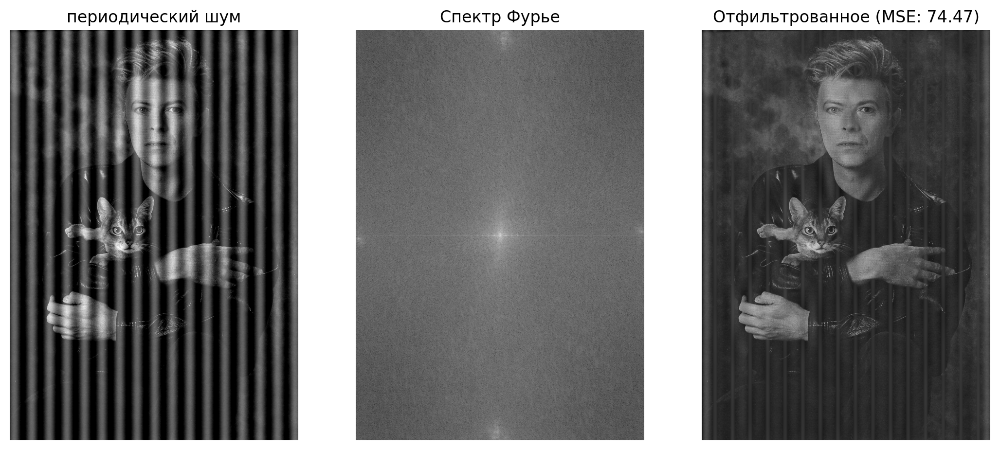

In [65]:
image_periodic = shum_arrays[-1][0]
image_original = im_array

dft = np.fft.fft2(image_periodic)
dft_shift = np.fft.fftshift(dft)
magnitude_spectrum = 20 * np.log(np.abs(dft_shift))

rows, cols = image_periodic.shape
crow, ccol = rows // 2, cols // 2
mask = np.ones((rows, cols), np.uint8)


r = 7
mag = np.abs(dft_shift)
crow, ccol = rows // 2, cols // 2
mag[crow-10:crow+10, ccol-10:ccol+10] = 0
ind = np.unravel_index(np.argmax(mag, axis=None), mag.shape)
max_y, max_x = ind
found_offset_x = np.abs(max_x - ccol)

print(f"Найденное смещение (offset): {found_offset_x}")

offsets = [found_offset_x]

for offset in offsets:
    mask[crow-r:crow+r, ccol-offset-r:ccol-offset+r] = 0
    mask[crow-r:crow+r, ccol+offset-r:ccol+offset+r] = 0
    

fshift = dft_shift * mask

f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)


mse_value = np.mean((image_original - img_back)**2)
print(f"MSE: {mse_value}")

fig, axes = plt.subplots(1, 3, figsize=(13, 6), dpi = 200)

axes[0].imshow(image_periodic, cmap='gray')
axes[0].set_title('периодический шум')
axes[0].axis('off')

axes[1].imshow(magnitude_spectrum, cmap='gray')
axes[1].set_title('Спектр Фурье')
axes[1].axis('off')

axes[2].imshow(img_back, cmap='gray')
axes[2].set_title(f'Отфильтрованное (MSE: {mse_value:.2f})')
axes[2].axis('off')

plt.show()